In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
df = pd.read_csv('liver_cirrhosis.csv')

In [4]:
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,2221,C,Placebo,18499,F,N,Y,N,N,0.5,149.000000,4.04,227.0,598.0,52.70,57.000000,256.0,9.9,1
1,1230,C,Placebo,19724,M,Y,N,Y,N,0.5,219.000000,3.93,22.0,663.0,45.00,75.000000,220.0,10.8,2
2,4184,C,Placebo,11839,F,N,N,N,N,0.5,320.000000,3.54,51.0,1243.0,122.45,80.000000,225.0,10.0,2
3,2090,D,Placebo,16467,F,N,N,N,N,0.7,255.000000,3.74,23.0,1024.0,77.50,58.000000,151.0,10.2,2
4,2105,D,Placebo,21699,F,N,Y,N,N,1.9,486.000000,3.54,74.0,1052.0,108.50,109.000000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,3584,D,D-penicillamine,23612,F,N,N,N,N,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,2
24996,3584,D,D-penicillamine,23612,F,N,N,N,N,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,2
24997,971,D,D-penicillamine,16736,F,N,Y,Y,Y,5.1,369.510563,3.23,18.0,790.0,179.80,124.702128,104.0,13.0,3
24998,3707,C,D-penicillamine,16990,F,N,Y,N,N,0.8,315.000000,4.24,13.0,1637.0,170.50,70.000000,426.0,10.9,2


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   N_Days         25000 non-null  int64  
 1   Status         25000 non-null  object 
 2   Drug           25000 non-null  object 
 3   Age            25000 non-null  int64  
 4   Sex            25000 non-null  object 
 5   Ascites        25000 non-null  object 
 6   Hepatomegaly   25000 non-null  object 
 7   Spiders        25000 non-null  object 
 8   Edema          25000 non-null  object 
 9   Bilirubin      25000 non-null  float64
 10  Cholesterol    25000 non-null  float64
 11  Albumin        25000 non-null  float64
 12  Copper         25000 non-null  float64
 13  Alk_Phos       25000 non-null  float64
 14  SGOT           25000 non-null  float64
 15  Tryglicerides  25000 non-null  float64
 16  Platelets      25000 non-null  float64
 17  Prothrombin    25000 non-null  float64
 18  Stage 

In [6]:
df[df.duplicated()]

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
51,2224,C,Placebo,17874,F,N,Y,N,N,0.9,346.000000,3.37,81.000000,1098.000000,122.450000,90.000000,298.0,10.0,1
69,2224,C,Placebo,17874,F,N,Y,N,N,0.9,346.000000,3.37,81.000000,1098.000000,122.450000,90.000000,298.0,10.0,1
107,681,D,Placebo,11462,F,N,N,N,N,1.2,369.510563,2.96,97.648387,1982.655769,122.556346,124.702128,293.0,10.9,2
149,617,CL,Placebo,15341,F,Y,N,Y,N,5.5,369.510563,2.31,97.648387,1982.655769,122.556346,124.702128,102.0,10.8,3
154,1170,C,Placebo,16658,F,N,Y,Y,S,1.3,369.510563,3.41,97.648387,1982.655769,122.556346,124.702128,430.0,11.9,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,3584,D,D-penicillamine,23612,F,N,N,N,N,0.8,231.000000,3.87,173.000000,9009.800000,127.710000,96.000000,295.0,11.0,2
24996,3584,D,D-penicillamine,23612,F,N,N,N,N,0.8,231.000000,3.87,173.000000,9009.800000,127.710000,96.000000,295.0,11.0,2
24997,971,D,D-penicillamine,16736,F,N,Y,Y,Y,5.1,369.510563,3.23,18.000000,790.000000,179.800000,124.702128,104.0,13.0,3
24998,3707,C,D-penicillamine,16990,F,N,Y,N,N,0.8,315.000000,4.24,13.000000,1637.000000,170.500000,70.000000,426.0,10.9,2


In [7]:
df = df.drop_duplicates()
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,2221,C,Placebo,18499,F,N,Y,N,N,0.5,149.000000,4.04,227.000000,598.000000,52.700000,57.000000,256.0,9.9,1
1,1230,C,Placebo,19724,M,Y,N,Y,N,0.5,219.000000,3.93,22.000000,663.000000,45.000000,75.000000,220.0,10.8,2
2,4184,C,Placebo,11839,F,N,N,N,N,0.5,320.000000,3.54,51.000000,1243.000000,122.450000,80.000000,225.0,10.0,2
3,2090,D,Placebo,16467,F,N,N,N,N,0.7,255.000000,3.74,23.000000,1024.000000,77.500000,58.000000,151.0,10.2,2
4,2105,D,Placebo,21699,F,N,Y,N,N,1.9,486.000000,3.54,74.000000,1052.000000,108.500000,109.000000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24963,3577,C,Placebo,17897,F,Y,N,Y,N,0.7,369.510563,3.49,97.648387,1982.655769,122.556346,124.702128,243.0,9.7,1
24971,4795,C,Placebo,23376,F,Y,N,Y,N,1.8,369.510563,3.24,97.648387,1982.655769,122.556346,124.702128,139.0,10.5,1
24972,3358,D,D-penicillamine,24585,F,N,Y,N,N,2.1,262.000000,3.48,58.000000,2045.000000,89.900000,84.000000,412.0,11.8,3
24991,4365,C,D-penicillamine,21324,F,N,N,N,N,0.9,346.000000,3.40,81.000000,1098.000000,122.450000,90.000000,228.0,10.3,2


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
N_Days,9639.0,1910.982571,1093.620373,41.00,1103.00,1690.000000,2598.000000,4795.00
Age,9639.0,18429.717606,3693.953156,9598.00,15628.00,18628.000000,20819.000000,28650.00
Bilirubin,9639.0,3.228571,4.512278,0.30,0.80,1.300000,3.300000,28.00
Cholesterol,9639.0,371.706706,197.824339,120.00,271.00,369.510563,369.510563,1775.00
Albumin,9639.0,3.496118,0.382319,1.96,3.29,3.520000,3.760000,4.64
Copper,9639.0,97.027569,73.108854,4.00,51.00,97.648387,102.000000,588.00
Alk_Phos,9639.0,1973.572709,1827.063380,289.00,1031.00,1713.000000,1982.655769,13862.40
SGOT,9639.0,122.317487,47.653515,26.35,89.90,122.556346,134.850000,457.25
Tryglicerides,9639.0,123.587337,55.206301,33.00,93.00,124.702128,125.000000,598.00
Platelets,9639.0,253.787605,95.740700,62.00,188.00,249.000000,307.000000,721.00


In [9]:
df.isnull().sum()

N_Days           0
Status           0
Drug             0
Age              0
Sex              0
Ascites          0
Hepatomegaly     0
Spiders          0
Edema            0
Bilirubin        0
Cholesterol      0
Albumin          0
Copper           0
Alk_Phos         0
SGOT             0
Tryglicerides    0
Platelets        0
Prothrombin      0
Stage            0
dtype: int64

In [188]:
#df['ID'] = range(1, len(df) + 1)
#df

In [166]:
#row_54 = df.iloc[646]
#print(row_54)

N_Days                      2297
Status                         D
Drug             D-penicillamine
Age                           78
Sex                            M
Ascites                        Y
Hepatomegaly                   Y
Spiders                        Y
Edema                          N
Bilirubin                    0.7
Cholesterol                282.0
Albumin                      3.0
Copper                      52.0
Alk_Phos                  9066.8
SGOT                       72.24
Tryglicerides              111.0
Platelets                   97.0
Prothrombin                 11.2
Stage                          3
ID                           647
Name: 775, dtype: object


In [92]:
from pandas_profiling import ProfileReport

In [93]:
profile = ProfileReport(df, title = 'Liver Dataset')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
#Đổi cột Age về dạng năm
df['Age'] = (df['Age'] / 365.25).astype(int)

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14676\1347320146.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Age'] = (df['Age'] / 365.25).astype(int)


In [11]:
#Đổi cột Age về nhóm tuổi
age_bins = [0, 20, 50, df['Age'].max()]
age_labels = ['1', '2', '3'] 
df['Age'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=True)

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14676\1268870210.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Age'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=True)


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9639 entries, 0 to 24992
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   N_Days         9639 non-null   int64   
 1   Status         9639 non-null   object  
 2   Drug           9639 non-null   object  
 3   Age            9639 non-null   category
 4   Sex            9639 non-null   object  
 5   Ascites        9639 non-null   object  
 6   Hepatomegaly   9639 non-null   object  
 7   Spiders        9639 non-null   object  
 8   Edema          9639 non-null   object  
 9   Bilirubin      9639 non-null   float64 
 10  Cholesterol    9639 non-null   float64 
 11  Albumin        9639 non-null   float64 
 12  Copper         9639 non-null   float64 
 13  Alk_Phos       9639 non-null   float64 
 14  SGOT           9639 non-null   float64 
 15  Tryglicerides  9639 non-null   float64 
 16  Platelets      9639 non-null   float64 
 17  Prothrombin    9639 non-null   float6

In [13]:
#Đổi kiểu dữ liệu cột Age
df['Age'] = df['Age'].astype(int)
df

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14676\2568053224.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Age'] = df['Age'].astype(int)


,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,2221,C,Placebo,2,F,N,Y,N,N,0.5,149.000000,4.04,227.000000,598.000000,52.700000,57.000000,256.0,9.9,1
1,1230,C,Placebo,3,M,Y,N,Y,N,0.5,219.000000,3.93,22.000000,663.000000,45.000000,75.000000,220.0,10.8,2
2,4184,C,Placebo,2,F,N,N,N,N,0.5,320.000000,3.54,51.000000,1243.000000,122.450000,80.000000,225.0,10.0,2
3,2090,D,Placebo,2,F,N,N,N,N,0.7,255.000000,3.74,23.000000,1024.000000,77.500000,58.000000,151.0,10.2,2
4,2105,D,Placebo,3,F,N,Y,N,N,1.9,486.000000,3.54,74.000000,1052.000000,108.500000,109.000000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24963,3577,C,Placebo,2,F,Y,N,Y,N,0.7,369.510563,3.49,97.648387,1982.655769,122.556346,124.702128,243.0,9.7,1
24971,4795,C,Placebo,3,F,Y,N,Y,N,1.8,369.510563,3.24,97.648387,1982.655769,122.556346,124.702128,139.0,10.5,1
24972,3358,D,D-penicillamine,3,F,N,Y,N,N,2.1,262.000000,3.48,58.000000,2045.000000,89.900000,84.000000,412.0,11.8,3
24991,4365,C,D-penicillamine,3,F,N,N,N,N,0.9,346.000000,3.40,81.000000,1098.000000,122.450000,90.000000,228.0,10.3,2


In [14]:
categorical_features = df.select_dtypes(include=['object']).columns
le = LabelEncoder()
for feature in categorical_features:
    df[feature] = le.fit_transform(df[feature])
df

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14676\3246071937.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature] = le.fit_transform(df[feature])
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14676\3246071937.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature] = le.fit_transform(df[feature])
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_14676\3246071937.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,2221,0,1,2,0,0,1,0,0,0.5,149.000000,4.04,227.000000,598.000000,52.700000,57.000000,256.0,9.9,1
1,1230,0,1,3,1,1,0,1,0,0.5,219.000000,3.93,22.000000,663.000000,45.000000,75.000000,220.0,10.8,2
2,4184,0,1,2,0,0,0,0,0,0.5,320.000000,3.54,51.000000,1243.000000,122.450000,80.000000,225.0,10.0,2
3,2090,2,1,2,0,0,0,0,0,0.7,255.000000,3.74,23.000000,1024.000000,77.500000,58.000000,151.0,10.2,2
4,2105,2,1,3,0,0,1,0,0,1.9,486.000000,3.54,74.000000,1052.000000,108.500000,109.000000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24963,3577,0,1,2,0,1,0,1,0,0.7,369.510563,3.49,97.648387,1982.655769,122.556346,124.702128,243.0,9.7,1
24971,4795,0,1,3,0,1,0,1,0,1.8,369.510563,3.24,97.648387,1982.655769,122.556346,124.702128,139.0,10.5,1
24972,3358,2,0,3,0,0,1,0,0,2.1,262.000000,3.48,58.000000,2045.000000,89.900000,84.000000,412.0,11.8,3
24991,4365,0,0,3,0,0,0,0,0,0.9,346.000000,3.40,81.000000,1098.000000,122.450000,90.000000,228.0,10.3,2


In [15]:
from scipy.stats import zscore

# Selecting numerical columns
numerical_columns = ['Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper']

# Calculate z-scores for numerical columns
z_scores = df[numerical_columns].apply(zscore)

# Define threshold for outliers (e.g., z-score > 3)
threshold = 3

# Filter DataFrame to exclude outliers
df_no_outliers = df[(z_scores.abs() < threshold).all(axis=1)]

# Calculate the percentage of outliers before removal
outliers_percentage_before = (df.shape[0] - df_no_outliers.shape[0]) / df.shape[0] * 100

# Display the shape before removing outliers
print("DataFrame shape before removing outliers:", df.shape)

# Display the number of removed rows (outliers)
removed_rows = df.shape[0] - df_no_outliers.shape[0]
print("Number of removed rows (outliers):", removed_rows)

# Display the percentage of outliers before removal
print("Percentage of outliers before removal:", outliers_percentage_before, "%")

# Update the original DataFrame with outliers removed
df = df_no_outliers.copy()

# Display the updated DataFrame shape
print("DataFrame shape after removing outliers:", df.shape)

# Calculate the percentage of outliers after removal
outliers_percentage_after = 0  # Since all outliers have been removed, the percentage is now 0

# Display the percentage of outliers after removal
print("Percentage of outliers after removal:", outliers_percentage_after, "%")

DataFrame shape before removing outliers: (9639, 19)
Number of removed rows (outliers): 739
Percentage of outliers before removal: 7.666770411868451 %
DataFrame shape after removing outliers: (8900, 19)
Percentage of outliers after removal: 0 %


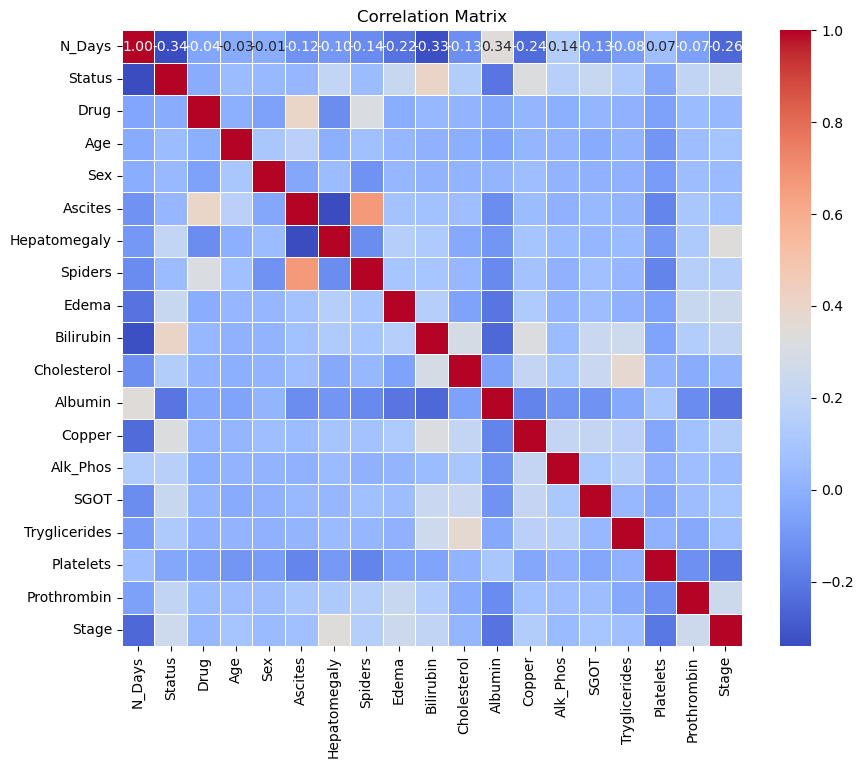

In [16]:
corr_matrix = df.corr()
plt.figure(figsize=(10, 8))  # Kích thước của biểu đồ
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

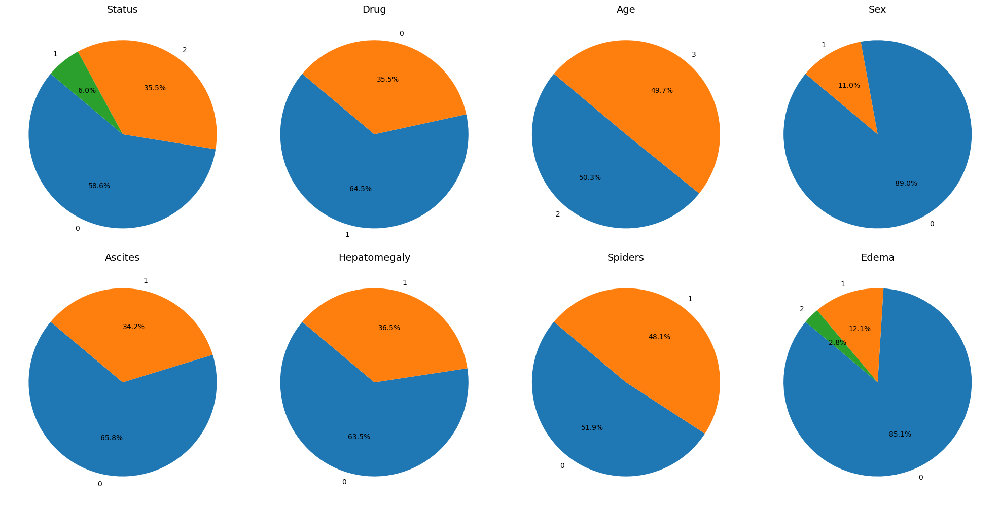

In [17]:
#Vẽ pie chart 
categorical_columns = ['Status', 'Drug', 'Age','Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema']
fig, axs = plt.subplots(2, 4, figsize=(20, 10)) 
axs = axs.flatten()
for i, column in enumerate(categorical_columns):
        axs[i].pie(df[column].value_counts(), labels=df[column].value_counts().index, autopct='%1.1f%%', startangle=140)
        axs[i].set_title(f'{column}', fontsize=14)
plt.tight_layout()
plt.show()

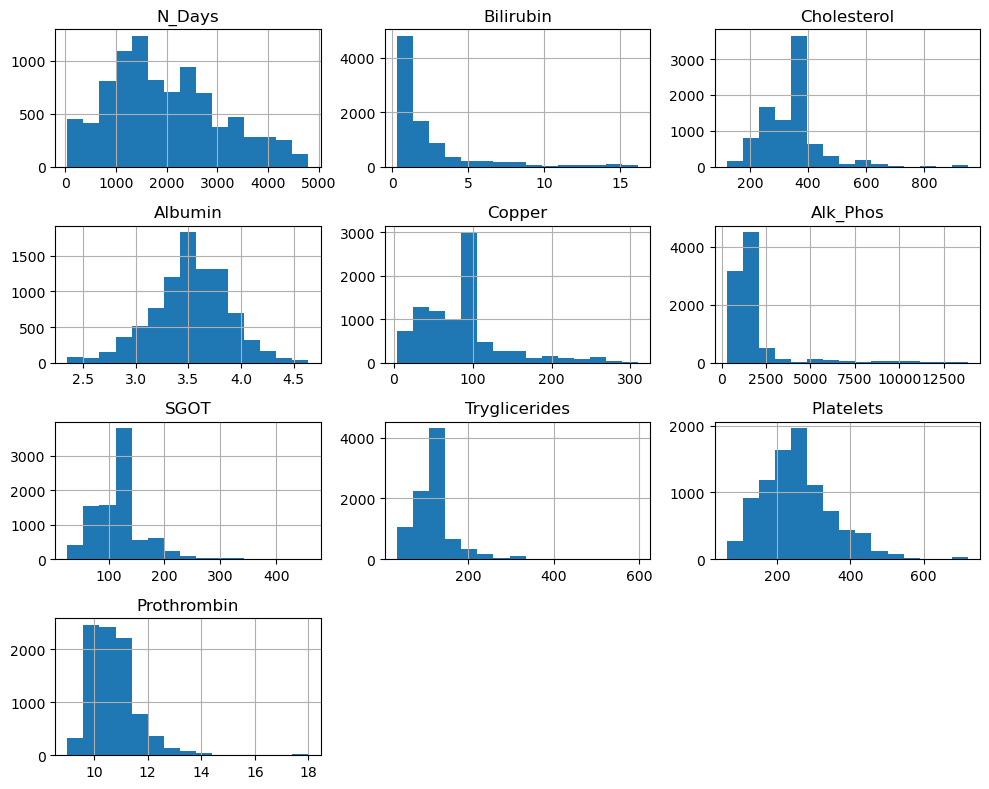

In [18]:
columns_to_plot = ['N_Days', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']
df[columns_to_plot].hist(figsize=(10, 8), bins=15)
plt.tight_layout()
plt.show()

In [19]:
#Chuẩn hóa dữ liệu số (Standardization/Normalization)

numerical_features = df.select_dtypes(include=['int64', 'float64', 'int32']).columns
numerical_features = numerical_features.drop(['Stage', 'Age', 'Status', 'Drug', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema'])

In [20]:
scaler = StandardScaler()
df[numerical_features] = scaler.fit_transform(df[numerical_features])
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,0.223340,0,1,2,-0.351763,0,1,0,0,-0.651128,-1.871632,1.446303,2.683094,-0.720770,-1.514785,-1.314018,0.014837,-0.865183,1
1,-0.682206,0,1,3,2.842821,1,0,1,0,-0.651128,-1.190881,1.141533,-1.243722,-0.685304,-1.693871,-0.935703,-0.364232,0.122002,2
2,2.017070,0,1,2,-0.351763,0,0,0,0,-0.651128,-0.208655,0.060985,-0.688221,-0.368838,0.107453,-0.830616,-0.311584,-0.755496,2
3,0.103636,2,1,2,-0.351763,0,0,0,0,-0.584239,-0.840781,0.615112,-1.224567,-0.488331,-0.937989,-1.293000,-1.090782,-0.536121,2
4,0.117343,2,1,3,-0.351763,0,1,0,0,-0.182907,1.405698,0.060985,-0.247652,-0.473054,-0.216994,-0.221109,-1.090782,0.889813,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24963,1.462412,0,1,2,-0.351763,1,0,1,0,-0.584239,0.272836,-0.077547,0.205338,0.034742,0.109927,0.108910,-0.122049,-1.084558,1
24971,2.575383,0,1,3,-0.351763,1,0,1,0,-0.216351,0.272836,-0.770205,0.205338,0.034742,0.109927,0.108910,-1.217139,-0.207060,1
24972,1.262296,2,0,3,-0.351763,0,1,0,0,-0.116018,-0.772706,-0.105253,-0.554135,0.068759,-0.649591,-0.746546,1.657472,1.218875,3
24991,2.182462,0,0,3,-0.351763,0,0,0,0,-0.517351,0.044196,-0.326904,-0.113565,-0.447955,0.107453,-0.620441,-0.279995,-0.426434,2


# Xây dựng mô hình


In [21]:
from sklearn.model_selection import train_test_split
X = df.drop('Stage', axis=1)
y = df['Stage']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state= 42)

# Kiểm tra lại các tập dữ liệu sau khi tiền xử lý
print(X_train.head())
print(y_train.head())

         N_Days  Status  Drug  Age       Sex  Ascites  Hepatomegaly  Spiders  \
4792  -0.864959       0     1    3 -0.351763        1             0        1   
3115   0.353095       0     0    3 -0.351763        0             1        1   
6295  -0.864959       0     1    3 -0.351763        1             0        1   
7815  -1.171986       2     0    2 -0.351763        0             1        1   
11457 -1.023042       0     0    2 -0.351763        0             1        0   

       Edema  Bilirubin  Cholesterol   Albumin    Copper  Alk_Phos      SGOT  \
4792       0  -0.450462     0.686047  1.307771  0.307849 -0.341556 -0.624007   
3115       0  -0.350129    -0.461505 -0.437729 -1.033015 -0.653112 -0.577492   
6295       0  -0.450462    -0.500405  1.307771 -0.937239  0.109681  1.585493   
7815       0  -0.550795    -0.364255 -1.601396  2.759715 -0.465960  0.287702   
11457      0   0.184981    -1.025556 -1.379745 -0.209341 -0.281537 -0.649591   

       Tryglicerides  Platelets  Proth

In [22]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
svc = SVC()
svc.fit(X_train, y_train)
        
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['linear', 'rbf']
}

grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, 
                           refit=True, verbose=2, cv=5, n_jobs=-1)

grid_search.fit(X_train, y_train)

# In ra giá trị tối ưu cho độ sâu
print("Best C:", grid_search.best_params_['C'])
print("Best gamma:", grid_search.best_params_['gamma'])
print("Best kernel:", grid_search.best_params_['kernel'])
    
# Make predictions
y_pred_svc = grid_search.predict(X_test)
print("Accuracy Score:\n", accuracy_score(y_test, y_pred_svc))

# Evaluate the classifier
print("SVC Classifier Report:\n", classification_report(y_test, y_pred_svc))

NameError: name 'GridSearchCV' is not defined

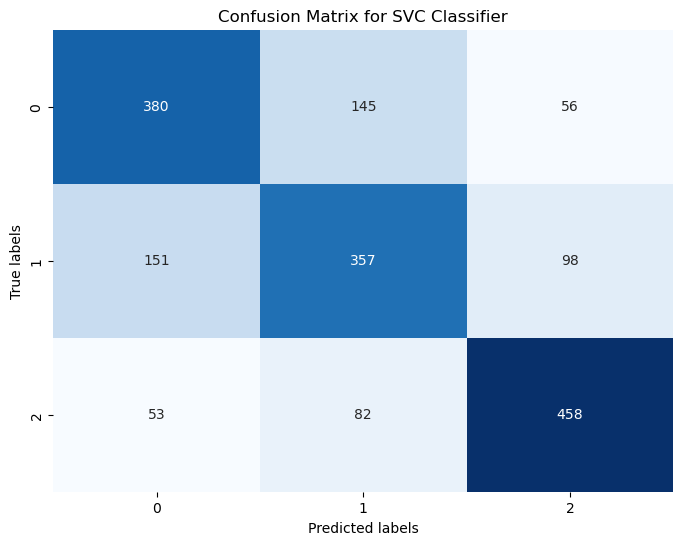

In [21]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
cm_svc = confusion_matrix(y_test, y_pred_svc)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svc, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for SVC Classifier')
plt.show()

In [23]:
#Mô hình Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
# Xác định các giá trị max depth, min samples leaf và min samples split muốn kiểm tra
param_grid = {'max_depth': [None, 10, 15, 20, 30],
              'min_samples_leaf': [2, 3, 4],
              'min_samples_split': [3, 4, 5, 6, 8, 9]}

# Tạo mô hình cây quyết định
dt = DecisionTreeClassifier(random_state = 42)

# Tìm kiếm siêu tham số tối ưu sử dụng GridSearchCV
grid_search = GridSearchCV(dt, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra với mô hình tốt nhất
y_pred_dt = grid_search.predict(X_test)

# In ra giá trị tối ưu cho độ sâu
print("Best max_depth:", grid_search.best_params_['max_depth'])
print("Best min_samples_leaf:", grid_search.best_params_['min_samples_leaf'])
print("Best min_samples_split:", grid_search.best_params_['min_samples_split'])

# Đánh giá hiệu suất
accuracy_DT = accuracy_score(y_test, y_pred_dt)
report_DT = classification_report(y_test, y_pred_dt)


print("Decision Tree Classification Report:\n", report_DT)

print("Accuracy:", accuracy_DT*100)

Best max_depth: 20
Best min_samples_leaf: 3
Best min_samples_split: 9
Decision Tree Classification Report:
               precision    recall  f1-score   support

           1       0.75      0.81      0.78       581
           2       0.75      0.72      0.74       606
           3       0.84      0.81      0.82       593

    accuracy                           0.78      1780
   macro avg       0.78      0.78      0.78      1780
weighted avg       0.78      0.78      0.78      1780

Accuracy: 77.86516853932585


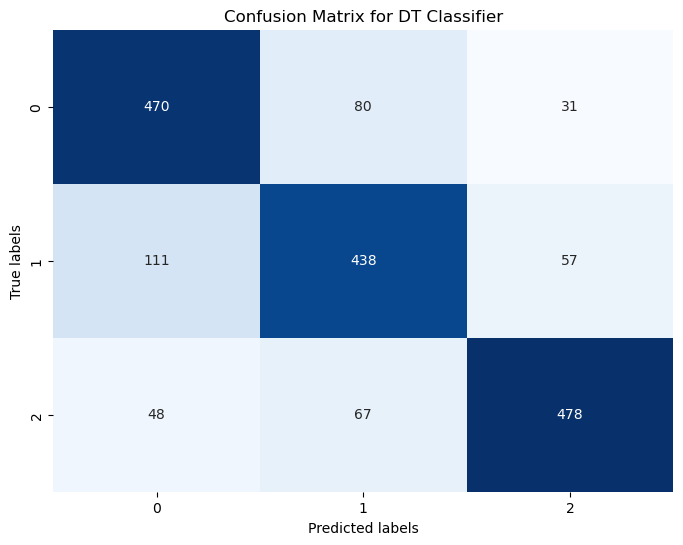

In [24]:
# Calculate the confusion matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for DT Classifier')
plt.show()

In [46]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30]
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=5, scoring = 'accuracy')

# Huấn luyện mô hình
grid_search.fit(X_train, y_train)

best_model_rf = grid_search.best_estimator_

# Dự đoán trên tập kiểm tra với mô hình tốt nhất
y_pred_rf = best_model_rf.predict(X_test)

# In ra giá trị tối ưu cho độ sâu
print("Best n_estimators:", grid_search.best_params_['n_estimators'])
print("Best max_features:", grid_search.best_params_['max_features'])
print("Best max_depth:", grid_search.best_params_['max_depth'])

# Đánh giá hiệu suất
accuracy_rf = accuracy_score(y_test, y_pred_rf)
report_rf = classification_report(y_test, y_pred_rf)

print("Random Forest Classification Report:\n", report_rf)

print("Accuracy:", accuracy_rf*100)

Best n_estimators: 400
Best max_features: sqrt
Best max_depth: None
Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.86      0.86       581
           1       0.84      0.82      0.83       606
           2       0.90      0.91      0.91       593

    accuracy                           0.86      1780
   macro avg       0.86      0.86      0.86      1780
weighted avg       0.86      0.86      0.86      1780

Accuracy: 86.46067415730337


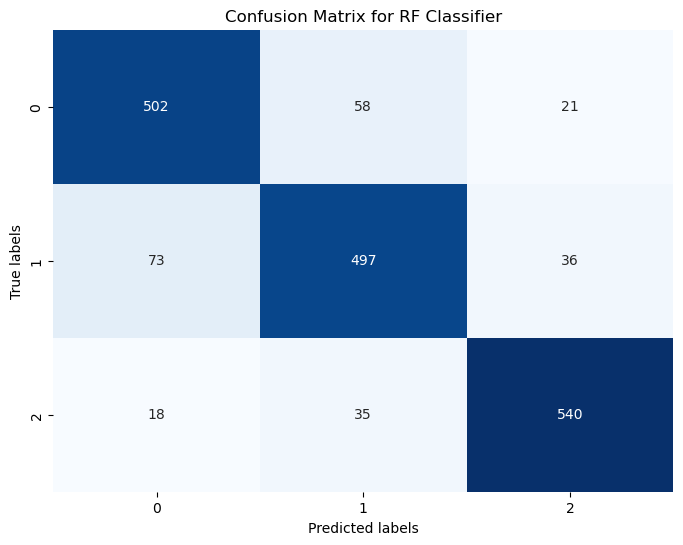

In [29]:
# Calculate the confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for RF Classifier')
plt.show()

In [34]:
#pip install lightgbm

  Obtaining dependency information for lightgbm from https://files.pythonhosted.org/packages/e1/4c/4685ccfae9806f561de716e32549190c1f533dde5bcadaf83bdf23972cf0/lightgbm-4.3.0-py3-none-win_amd64.whl.metadata
   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
    --------------------------------------- 0.0/1.3 MB 660.6 kB/s eta 0:00:02
   - -------------------------------------- 0.1/1.3 MB 656.4 kB/s eta 0:00:02
   ---- ----------------------------------- 0.1/1.3 MB 1.1 MB/s eta 0:00:02
   ------ --------------------------------- 0.2/1.3 MB 1.3 MB/s eta 0:00:01
   ------------- -------------------------- 0.5/1.3 MB 2.0 MB/s eta 0:00:01
   ----------------------- ---------------- 0.8/1.3 MB 2.9 MB/s eta 0:00:01
   ---------------------------------- ----- 1.2/1.3 MB 3.7 MB/s eta 0:00:01
   ---------------------------------------- 1.3/1.3 MB 4.0 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [49]:
import lightgbm as lgb

lgbm = lgb.LGBMClassifier()

# Huấn luyện mô hình
lgbm.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred_lgbm = lgbm.predict(X_test)

# Đánh giá mô hình
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
report_lgbm = classification_report(y_test, y_pred_lgbm)

print("Classification Report:\n", report_lgbm)
print("Accuracy:", accuracy_lgbm*100)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1638
[LightGBM] [Info] Number of data points in the train set: 7120, number of used features: 18
[LightGBM] [Info] Start training from score -1.120048
[LightGBM] [Info] Start training from score -1.081208
[LightGBM] [Info] Start training from score -1.094967
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.90      0.90       581
           1       0.89      0.88      0.88       606
           2       0.92      0.93      0.93       593

    accuracy                           0.91      1780
   macro avg       0.91      0.91      0.91      1780
weighted avg       0.91      0.91      0.91      1780

Accuracy: 90.56179775280899


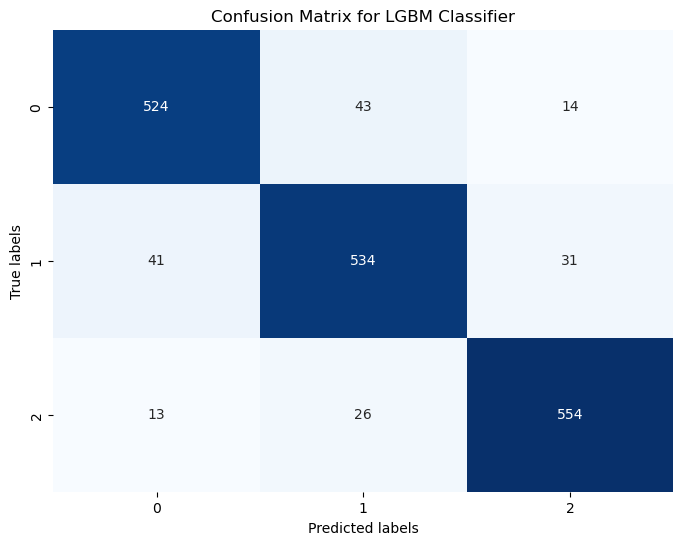

In [50]:
# Calculate the confusion matrix
cm_lgbm = confusion_matrix(y_test, y_pred_lgbm)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lgbm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for LGBM Classifier')
plt.show()

In [37]:
#pip install catboost

  Obtaining dependency information for catboost from https://files.pythonhosted.org/packages/35/7e/35fa1a7cf6925ff438e849cca50c88b8d28e02d9c3486442f2f85b86184a/catboost-1.2.5-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/101.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/101.1 MB 220.2 kB/s eta 0:07:40
   ---------------------------------------- 0.0/101.1 MB 220.2 kB/s eta 0:07:40
   ---------------------------------------- 0.0/101.1 MB 220.2 kB/s eta 0:07:40
   ---------------------------------------- 0.0/101.1 MB 131.3 kB/s eta 0:12:50
   ---------------------------------------- 0.1/101.1 MB 182.2 kB/s eta 0:09:15
   ---------------------------------------- 0.1/101.1 MB 187.3 kB/s eta 0:09:00
   -----------------------

In [48]:
from catboost import CatBoostClassifier
# Khởi tạo mô hình CatBoost
catboost = CatBoostClassifier()

# Huấn luyện mô hình
catboost.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred_cb = catboost.predict(X_test)

# Đánh giá mô hình
accuracy_cb = accuracy_score(y_test, y_pred_cb)
report_cb = classification_report(y_test, y_pred_cb)
conf_matrix = confusion_matrix(y_test, y_pred_cb)

print("Classification Report:\n", report_cb)
print("Accuracy:", accuracy_cb*100)

Learning rate set to 0.087458
0:	learn: 1.0664705	total: 4.38ms	remaining: 4.38s
1:	learn: 1.0407605	total: 8.65ms	remaining: 4.32s
2:	learn: 1.0189952	total: 12.7ms	remaining: 4.21s
3:	learn: 0.9996986	total: 16.4ms	remaining: 4.1s
4:	learn: 0.9814427	total: 20.4ms	remaining: 4.05s
5:	learn: 0.9664521	total: 24.3ms	remaining: 4.03s
6:	learn: 0.9500071	total: 28.2ms	remaining: 4s
7:	learn: 0.9347887	total: 32ms	remaining: 3.96s
8:	learn: 0.9222436	total: 36.1ms	remaining: 3.97s
9:	learn: 0.9101334	total: 40.4ms	remaining: 4s
10:	learn: 0.8985180	total: 44.6ms	remaining: 4.01s
11:	learn: 0.8904626	total: 48.5ms	remaining: 3.99s
12:	learn: 0.8786993	total: 52.4ms	remaining: 3.98s
13:	learn: 0.8704305	total: 56.4ms	remaining: 3.97s
14:	learn: 0.8649271	total: 60.5ms	remaining: 3.97s
15:	learn: 0.8566846	total: 64.7ms	remaining: 3.98s
16:	learn: 0.8483762	total: 69.1ms	remaining: 4s
17:	learn: 0.8411727	total: 73.1ms	remaining: 3.99s
18:	learn: 0.8337091	total: 76.8ms	remaining: 3.96s
19:	

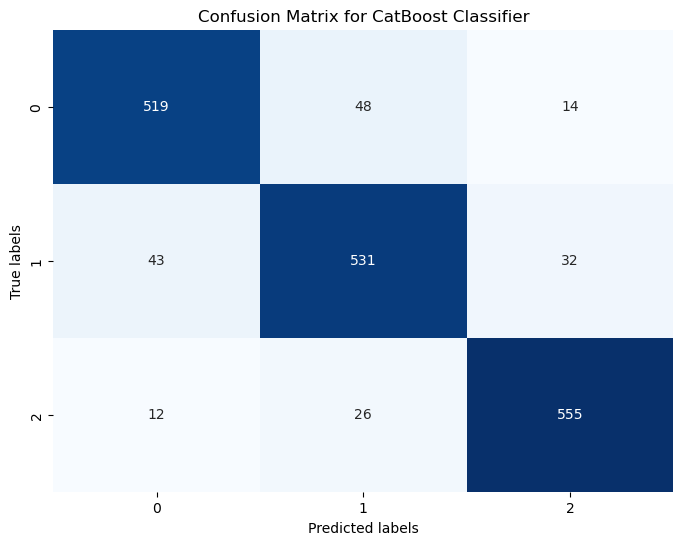

In [51]:
# Calculate the confusion matrix
cm_cb = confusion_matrix(y_test, y_pred_cb)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_cb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for CatBoost Classifier')
plt.show()

In [39]:
# Mã hóa lại các nhãn
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Chia dữ liệu thành train và test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

In [31]:
#pip install xgboost

  Obtaining dependency information for xgboost from https://files.pythonhosted.org/packages/24/ec/ad387100fa3cc2b9b81af0829b5ecfe75ec5bb19dd7c19d4fea06fb81802/xgboost-2.0.3-py3-none-win_amd64.whl.metadata
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB 262.6 kB/s eta 0:06:20
   ---------------------------------------- 0.0/99.8 MB 262.6 kB/s eta 0:06:20
   ---------------------------------------- 0.0/99.8 MB 262.6 kB/s eta 0:06:20
   ---------------------------------------- 0.0/99.8 MB 151.3 kB/s eta 0:10:59
   ---------------------------------------- 0.1/99.8 MB 204.8 kB/s eta 0:08:07
   ---------------------------------------- 0.1/99.8 MB 249.8 kB/s eta 0:06:40
   ---------------------------------------- 0.1/99.8 MB 300.4 kB/s eta 0:05:32
   -----------------------------

In [47]:
from xgboost import XGBClassifier
xgb = XGBClassifier(random_state = 42)


# Thiết lập các giá trị của tham số cần tinh chỉnh
param_grid = {
    'n_estimators': [100, 200, 300],
    'subsample': [0.6, 0.8, 1.0]
}

# Tìm kiếm tham số tối ưu bằng GridSearchCV
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# In ra kết quả tốt nhất
print("Best n_estimators:", grid_search.best_params_['n_estimators'])
print("Best subsample:", grid_search.best_params_['subsample'])


# Đánh giá mô hình với các tham số tốt nhất trên tập kiểm tra
best_model_xgb = grid_search.best_estimator_

y_pred_xgb = best_model_xgb.predict(X_test)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
report_xgb = classification_report(y_test, y_pred_xgb)


print("Classification Report:\n", report_xgb)
print("Accuracy:", accuracy_xgb*100)

Best n_estimators: 200
Best subsample: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.90      0.90       581
           1       0.89      0.89      0.89       606
           2       0.92      0.93      0.93       593

    accuracy                           0.91      1780
   macro avg       0.91      0.91      0.91      1780
weighted avg       0.91      0.91      0.90      1780

Accuracy: 90.50561797752809


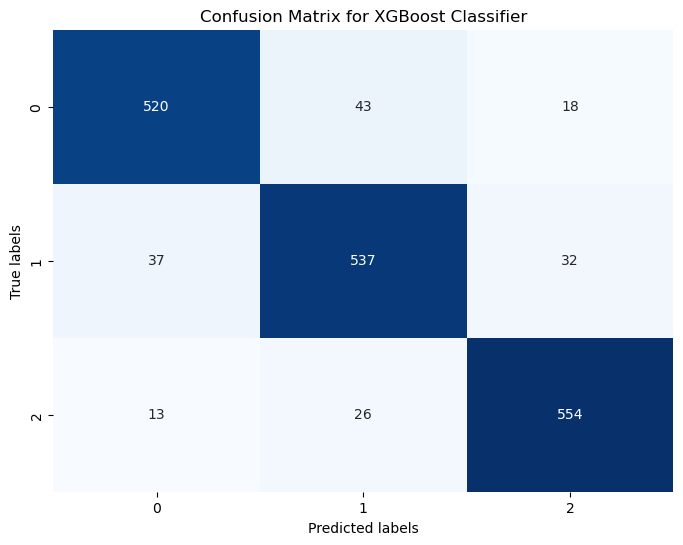

In [52]:
# Calculate the confusion matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for XGBoost Classifier')
plt.show()